In [1]:
import os
import cv2
import time
import pickle
import numpy as np
import tensorflow as tf
from scipy import spatial
from keras.layers import Input 
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from keras.applications.efficientnet_v2 import preprocess_input
from keras.applications.efficientnet_v2 import EfficientNetV2B0

In [3]:
def load_images_from_folder(folder):
    images = []
    images_path = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            images.append(img)
            images_path.append(filename)
    return images,images_path

In [4]:
images,images_path = np.array(load_images_from_folder(original_images_path))

C:\Users\Hazim\AppData\Local\Temp\ipykernel_22668\2274426572.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  images,images_path = np.array(load_images_from_folder())


In [5]:
print(images[1].shape)

(640, 555, 3)


001921AS.JPG
(640, 555, 3)


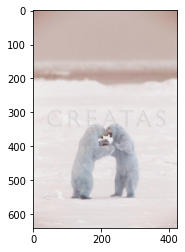

In [6]:
plt.imshow(images[45]) 
print(images_path[3])
print(images[3].shape)

<h1>Task 1 Histogram features</>
<p>Write a function that will take an image as input, convert it into a grid of 3 × 3, and 
compute histogram for each channel. The function would return the final feature vector 
of histograms of each grid in the image. The size of the feature vector would be 
2
8 × 3 × 9 = 6912</p>

In [7]:
def histogram(img):
  blue_color = cv2.calcHist([img], [0], None, [256], [0, 256])
  red_color = cv2.calcHist([img], [1], None, [256], [0, 256])
  green_color = cv2.calcHist([img], [2], None, [256], [0, 256])
  list=blue_color.flatten() 
  list = np.concatenate((list, red_color.flatten()))
  list = np.concatenate((list,green_color.flatten()))
  
  return list


In [8]:
def feature_vector_matrix(image):
  height,width = image.shape[0],image.shape[1]
  row1=round(height/3)
  row2 = round(height*2/3)
  row3 = height-row2
  col1=round(width/3)
  col2 = round(width*2/3)
  col3 = width-col2

  img1 = image[:row1,:col1]
  feature_vector = histogram(img1)
  img12 = image[:row1,col1:col2]
  feature_vector = np.concatenate((feature_vector, histogram(img12)))
  img13 = image[:row1,col2:col3+col2]
  feature_vector = np.concatenate((feature_vector, histogram(img13)))

  img2 = image[row1:row2,:col1]
  feature_vector = np.concatenate((feature_vector, histogram(img2)))
  img22 = image[row1:row2,col1:col2]
  feature_vector = np.concatenate((feature_vector,histogram(img22)))
  
  img23 = image[row1:row2,col2:col3+col2]
  feature_vector = np.concatenate((feature_vector, histogram(img23)))
  

  img3 = image[row2:row3+row2,:col1]
  feature_vector = np.concatenate((feature_vector,   histogram(img3)))
  img32 = image[row2:row3+row2,col1:col2]
  feature_vector = np.concatenate((feature_vector, histogram(img32)))
  
  img33 = image[row2:row3+row2,col2:col3+col2]
  feature_vector = np.concatenate((feature_vector, histogram(img33)))
  
  return feature_vector


Write a function that takes a list of images names as input. For each image, the function 
is supposed to read it, convert it into a numpy array, and send the feature conversion 
function defined above. Each feature vector is then concatenated into a list and the final 
list is stored on hard drive (see how to pickle data in python). We will call this feature 
database. Also, save the image path in a separate list in a way that each image names’
index matches to that of features list. If you have 1000 total images, you will have a 
1000 × 6912 array of features and a list of length 1000 containing image paths.

In [9]:
def features(list_img):
  list = np.array([feature_vector_matrix(list_img[0])])
  for x in range(1,len(list_img)):
    list = np.append(list, [feature_vector_matrix(list_img[x])], axis=0)
  return list

features_matrix = features(images)
print(features_matrix.shape)


(5868, 6912)


In [10]:
file_name = original_images_pkl_path

with open(file_name, 'wb') as handle:
    pickle.dump(features_matrix, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [11]:
with open(file_name, 'rb') as handle:
    feature_matrix = pickle.load(handle)
print(feature_matrix.shape)

(5868, 6912)


In [12]:
def top_results(images,diff_list):
    temp_paths = images
    temp_diff = diff_list
    results = []
    for x in range(0,9):
        min = diff_list[0]
        min_index = 0
        for x in range(0,len(temp_diff)):
            if(min>temp_diff[x]):
                min = temp_diff[x]
                min_index = x
        results.append(temp_paths[min_index])
        temp_paths = np.delete(temp_paths,min_index)
        temp_diff = np.delete(temp_diff,min_index)
    return results




In [13]:
def display_result(results=[]):
    image1 = results[0]
    image2 = results[1]
    image3 = results[2]
    image4 = results[3]
    image5 = results[4]
    image6 = results[5]
    image7 = results[6]
    image8 = results[7]
    image9 = results[8]
    fig = plt.figure(figsize=(10, 7))
    fig.add_subplot(3, 3, 1)
    plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
    fig.add_subplot(3, 3, 2)
    plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
    fig.add_subplot(3, 3, 3)
    plt.imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
    fig.add_subplot(3, 3, 4)
    plt.imshow(cv2.cvtColor(image4, cv2.COLOR_BGR2RGB))
    fig.add_subplot(3, 3, 5)
    plt.imshow(cv2.cvtColor(image5, cv2.COLOR_BGR2RGB))
    fig.add_subplot(3, 3, 6)
    plt.imshow(cv2.cvtColor(image6, cv2.COLOR_BGR2RGB))
    fig.add_subplot(3, 3, 7)
    plt.imshow(cv2.cvtColor(image7, cv2.COLOR_BGR2RGB))
    fig.add_subplot(3, 3, 8)
    plt.imshow(cv2.cvtColor(image8, cv2.COLOR_BGR2RGB))
    fig.add_subplot(3, 3, 9)
    plt.imshow(cv2.cvtColor(image9, cv2.COLOR_BGR2RGB))


In [14]:
def top_search(query, distance_measure, images_features, images_path, images):
    list_of_diff = []
    img_features_matrix = np.array(query)
    img_features_matrix = features([img_features_matrix])
    if(distance_measure == "Absolute_Difference"):
        for x in range(0, len(images_features)):
            diff = img_features_matrix - images_features[x]
            m_sum = np.sum(abs(diff))
            list_of_diff.append(m_sum)
        results = top_results(images, list_of_diff)
        display_result(results=results)
    elif(distance_measure == "Euclidian_Distance"):
        for x in range(0, len(images_features)):
            el_diff = np.sqrt(
                np.sum(np.square(img_features_matrix-images_features[x])))
            list_of_diff.append(el_diff)
        results = top_results(images, list_of_diff)
        display_result(results=results)
    elif(distance_measure == "Cosine_Similarity"):
        for x in range(0, len(images_features)):
            cos_diff = spatial.distance.cosine(img_features_matrix, images_features[x])
            list_of_diff.append(cos_diff)
        results = top_results(images, list_of_diff)
        display_result(results=results)




In [15]:
def load_test_images_from_folder(folder=test_images_path):
    images = []
    images_path = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            images.append(img)
            images_path.append(filename)
    return images,images_path
test_images,test_images_path = load_test_images_from_folder()

225t.jpgtest image
336t.jpgtest image
747.jpgtest image
Time taken by Absolute_Difference distance measure 0.9845664501190186


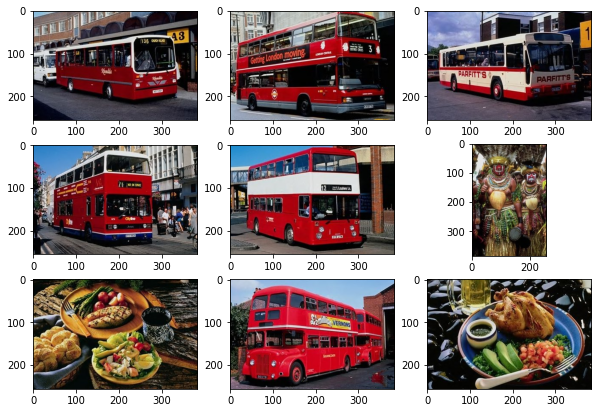

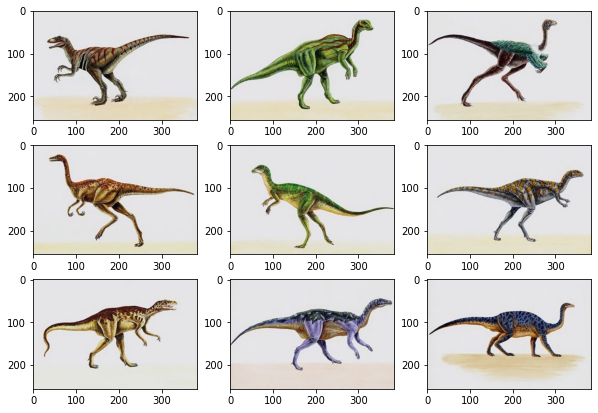

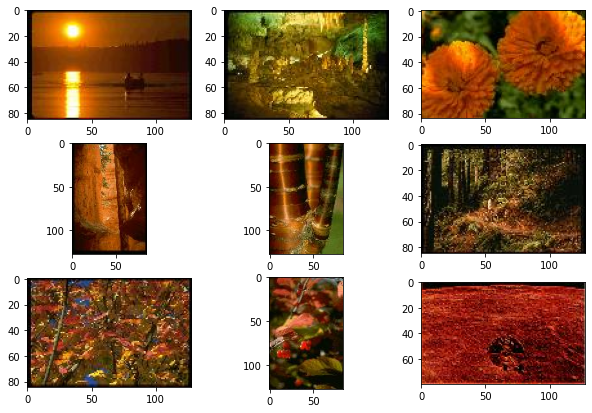

In [16]:
start = time.time()
for x in range(0,len(test_images)):
    print(test_images_path[x] +"test image")
    top_search(test_images[x],"Absolute_Difference",images_features=feature_matrix,images_path=images_path,images=images)
stop = time.time()
print("Time taken by Absolute_Difference distance measure",stop-start)

225t.jpgtest image
336t.jpgtest image
747.jpgtest image
Time taken by Euclidian_Distance distance measure 1.177870273590088


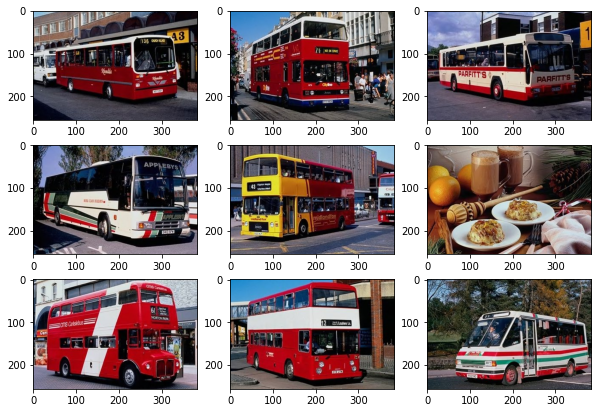

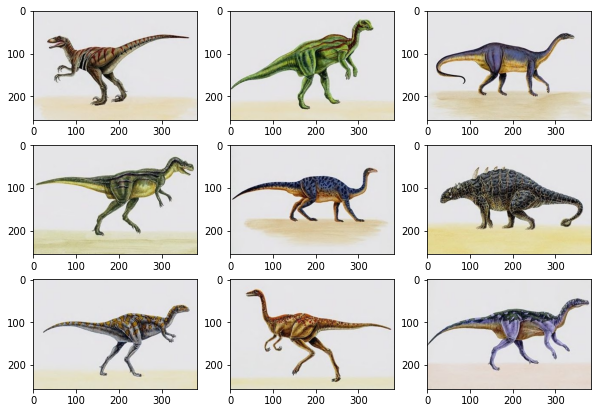

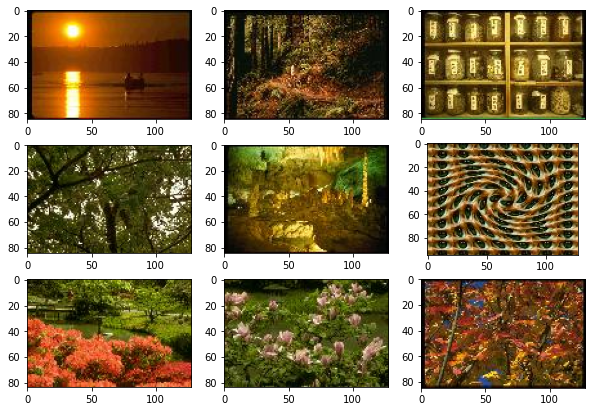

In [17]:
start = time.time()
for x in range(0,len(test_images)):
    print(test_images_path[x] +"test image")
    top_search(test_images[x],"Euclidian_Distance",images_features=feature_matrix,images_path=images_path,images=images)
stop = time.time()
print("Time taken by Euclidian_Distance distance measure",stop-start)

225t.jpgtest image
336t.jpgtest image
747.jpgtest image
Time taken by Cosine_Similarity distance measure 1.914397954940796


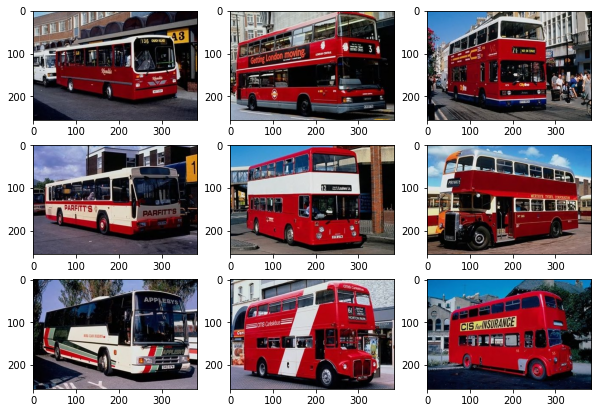

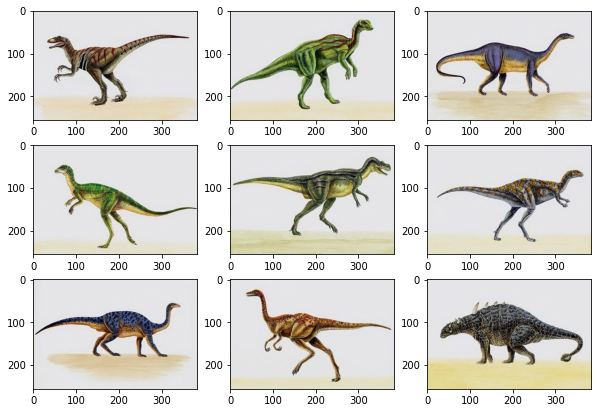

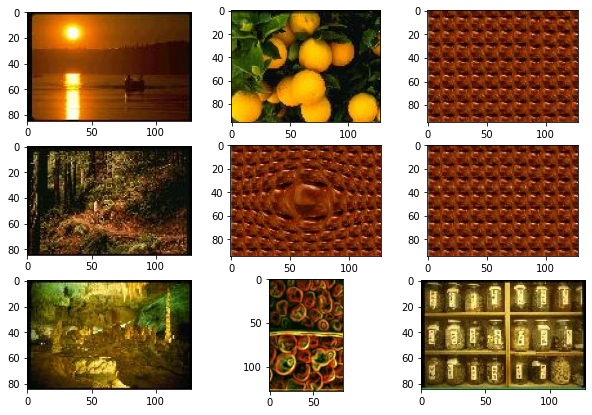

In [18]:
start = time.time()
for x in range(0,len(test_images)):
    print(test_images_path[x] +"test image")
    top_search(test_images[x],"Cosine_Similarity",images_features=feature_matrix,images_path=images_path,images=images)
stop = time.time()
print("Time taken by Cosine_Similarity distance measure",stop-start)

Task 2
Write a function that will load the feature database stored as a result of Task 1 above. 
Then apply PCA and only select 1000 components. This way, for each image, the feature 
vector is no more of length 6912 and is reduced to 1000 dimensions. Save this PCA 
reduced feature database to hard drive. Also save the PCA object on the hard drive so 
that later we can use it to for query image.

In [19]:
file_name = original_images_pkl_path

with open(file_name, 'rb') as handle:
    feature_matrix = pickle.load(handle)
print(feature_matrix.shape)

(5868, 6912)


In [20]:
from sklearn.decomposition import PCA

def PCA_image(feature_matrix):
    pca = PCA(n_components=1000)
    pca_file_name =pca_images_pkl_path
    reduce_feature_matrix = pca.fit_transform(feature_matrix)
    print(reduce_feature_matrix.shape)
    file_name = reduced_images_pkl_path
    with open(file_name, 'wb') as handle:
        pickle.dump(reduce_feature_matrix, handle, protocol=pickle.HIGHEST_PROTOCOL)
    with open(pca_file_name, 'wb') as handle:
        pickle.dump(pca, handle, protocol=pickle.HIGHEST_PROTOCOL)
    return reduce_feature_matrix 
    
pca_feature_matrix = PCA_image(feature_matrix)

(5868, 1000)


In [21]:
def load_pca():
    file_name = pca_images_pkl_path
    with open(file_name, 'rb') as handle:
        pca = pickle.load(handle)
    return pca


Write a function that takes a query image path and a distance measure to use as input, 
reads the query image and converts it to a feature vector of length 6912. Then it loads 
the PCA object saved above and transforms the query image into 1000 dimensional 
principal components. Then for each feature vector in reduced feature database, it 
computes the distance with query image features using the distance measure passed as 
parameter. Finally, it returns the top 9 most similar images.

In [22]:
def pca_top_search(query, distance_measure, images_features, images_path, images):
    list_of_diff = []
    pca_query_feature_matrix = np.array(query)
    pca_query_feature_matrix = features([pca_query_feature_matrix])
    pca = load_pca()
    pca_query_feature_matrix = pca.transform(pca_query_feature_matrix)
    if(distance_measure == "Absolute_Difference"):
        for x in range(0, len(images_features)):
            diff = pca_query_feature_matrix - images_features[x]
            m_sum = np.sum(abs(diff))
            list_of_diff.append(m_sum)
        list_of_diff = np.array(list_of_diff)
        results = top_results(images, list_of_diff)
        display_result(results=results)
    elif(distance_measure == "Euclidian_Distance"):
        for x in range(0, len(images_features)):
            el_diff = np.sqrt(
                np.sum(np.square(pca_query_feature_matrix-images_features[x])))
            list_of_diff.append(el_diff)
        results = top_results(images, list_of_diff)
        display_result(results=results)
    elif(distance_measure == "Cosine_Similarity"):
        for x in range(0, len(images_features)):
            cos_diff = spatial.distance.cosine(pca_query_feature_matrix, images_features[x])
            list_of_diff.append(cos_diff)
        results = top_results(images, list_of_diff)
        display_result(results=results)

225t.jpgtest image
336t.jpgtest image
747.jpgtest image
Time taken by Absolute_Difference distance measure 1.2048590183258057


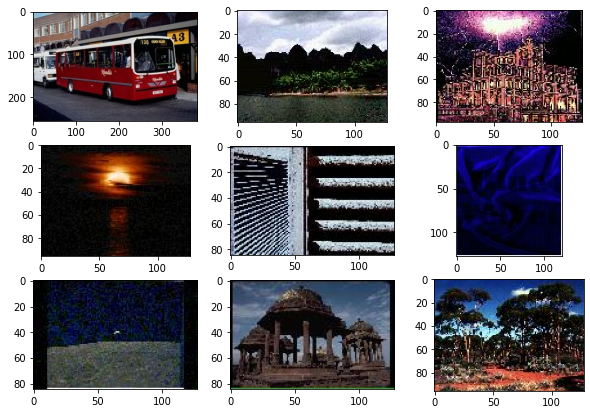

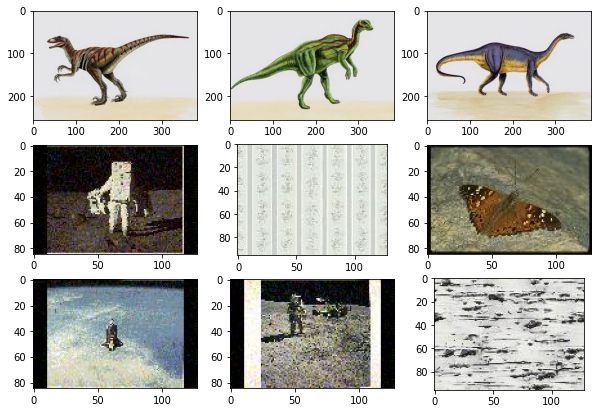

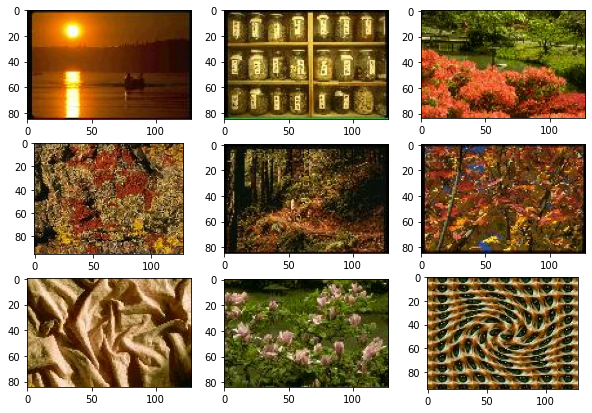

In [23]:
start = time.time()
for x in range(0,len(test_images)):
    print(test_images_path[x] +"test image")
    pca_top_search(test_images[x],"Absolute_Difference",images_features=pca_feature_matrix,images_path=images_path,images=images)
stop = time.time()
print("Time taken by Absolute_Difference distance measure",stop-start)

225t.jpgtest image
336t.jpgtest image
747.jpgtest image
Time taken by Euclidian_Distance distance measure 1.413362741470337


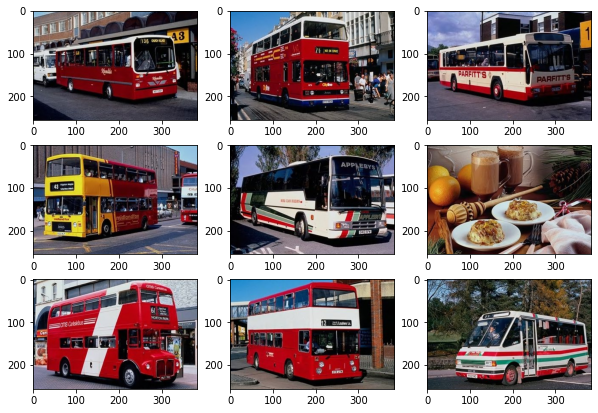

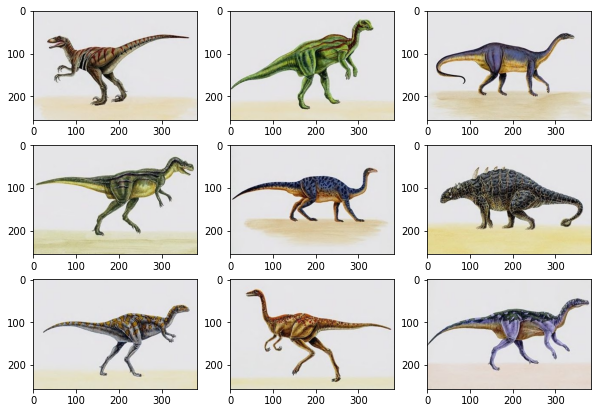

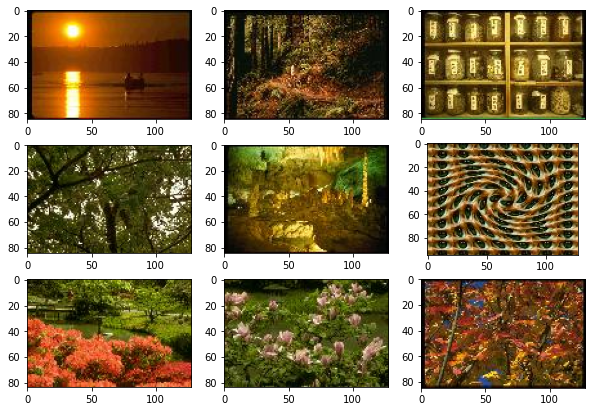

In [24]:
start = time.time()
for x in range(0,len(test_images)):
    print(test_images_path[x] +"test image")
    pca_top_search(test_images[x],"Euclidian_Distance",images_features=pca_feature_matrix,images_path=images_path,images=images)
stop = time.time()
print("Time taken by Euclidian_Distance distance measure",stop-start)

225t.jpgtest image
336t.jpgtest image
747.jpgtest image
Time taken by Cosine_Similarity distance measure 2.6543772220611572


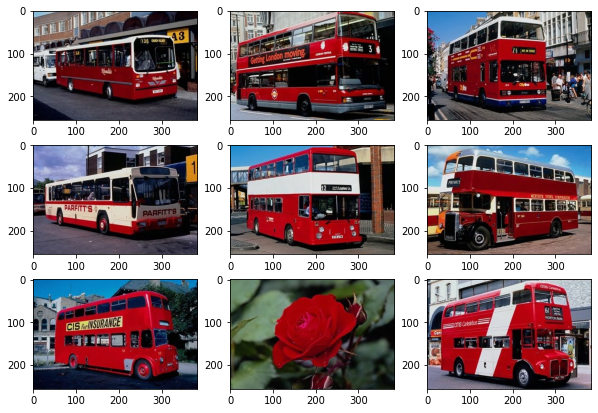

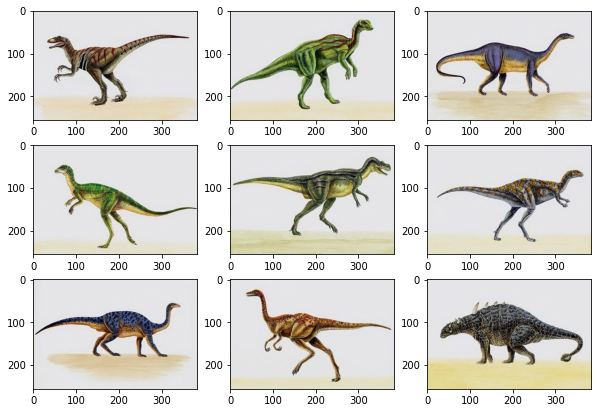

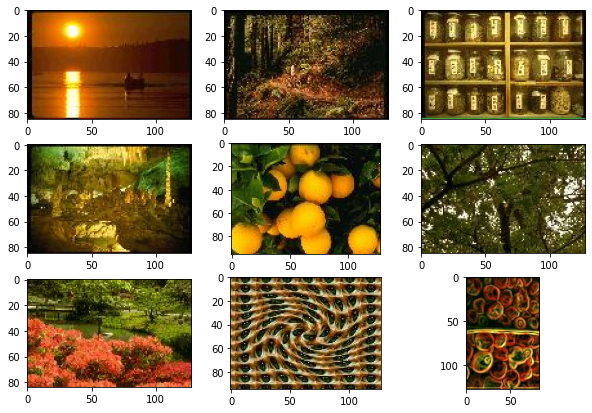

In [25]:
start = time.time()
for x in range(0,len(test_images)):
    print(test_images_path[x] +"test image")
    pca_top_search(test_images[x],"Cosine_Similarity",images_features=pca_feature_matrix,images_path=images_path,images=images)
stop = time.time()
print("Time taken by Cosine_Similarity distance measure",stop-start)

Task 3
Define a model using any pretrained models. As we do not need final classification layer, 
set “include_top = False”. See 
tf.keras.applications.efficientnet_v2.EfficientNetV2B0 | TensorFlow Core v2.9.1 for an 
example.

In [23]:
#resize all images
resize_images = images
print(resize_images[0].shape)

for x in range(0, len(images)):
    if(images[x].shape[0] != 224 or images[x].shape[1] != 224):
        resize_images[x] = cv2.resize(images[x], (224,224))

print(resize_images[0].shape)


(85, 128, 3)
(224, 224, 3)


In [24]:
EfficientNetV2B0_model = EfficientNetV2B0(include_top = False, weights = 'imagenet', input_tensor = Input(shape = (224, 224, 3)))


In [25]:
def features_extract_EfficientNetV2B0(img, model):
    
    img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
    img = preprocess_input(img) 
    features = model.predict(img)
    features = features.reshape(features.shape[1] * features.shape[2] * features.shape[3])
    print(features.shape)
    
    return features

In [26]:
feature = features_extract_EfficientNetV2B0(resize_images[0],EfficientNetV2B0_model)

1/1 [==============================] - 1s 1s/step
(62720,)


In [33]:
def EfficientNetV2B0_features_matrix(list_img,model):
    list = np.array([features_extract_EfficientNetV2B0(list_img[0],model)])
    for x in range(1,len(list_img)):
        list = np.append(list, [features_extract_EfficientNetV2B0(list_img[x],model)], axis=0)
    return list

deep_features_2 = EfficientNetV2B0_features_matrix(resize_images,EfficientNetV2B0_model)

1/1 [==============================] - 0s 61ms/step
(62720,)
1/1 [==============================] - 0s 53ms/step
(62720,)
1/1 [==============================] - 0s 80ms/step
(62720,)
1/1 [==============================] - 0s 59ms/step
(62720,)
1/1 [==============================] - 0s 43ms/step
(62720,)
1/1 [==============================] - 0s 60ms/step
(62720,)
1/1 [==============================] - 0s 56ms/step
(62720,)
1/1 [==============================] - 0s 73ms/step
(62720,)
1/1 [==============================] - 0s 50ms/step
(62720,)
1/1 [==============================] - 0s 51ms/step
(62720,)
1/1 [==============================] - 0s 42ms/step
(62720,)
1/1 [==============================] - 0s 64ms/step
(62720,)
1/1 [==============================] - 0s 44ms/step
(62720,)
1/1 [==============================] - 0s 48ms/step
(62720,)
1/1 [==============================] - 0s 57ms/step
(62720,)
1/1 [==============================] - 0s 52ms/step
(62720,)
1/1 [===================

In [34]:
file_name = deep_features_pkl_path

with open(file_name, 'wb') as handle:
    pickle.dump(deep_features_2, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [35]:
file_name = deep_features_pkl_path

with open(file_name, 'rb') as handle:
    deep_features_2 = pickle.load(handle)
print(deep_features_2.shape)

(5868, 62720)


In [36]:
test_images,test_images_path = load_test_images_from_folder()

In [38]:
def deep_features_top_search(query, distance_measure, images_features, model, images):
    list_of_diff = []
    deep_features_query_feature_matrix = np.array(query)
    deep_features_query_feature_matrix = EfficientNetV2B0_features_matrix([deep_features_query_feature_matrix],model)
    if(distance_measure == "Absolute_Difference"):
        for x in range(0, len(images_features)):
            diff = deep_features_query_feature_matrix - images_features[x]
            m_sum = np.sum(abs(diff))
            list_of_diff.append(m_sum)
        list_of_diff = np.array(list_of_diff)
        results = top_results(images, list_of_diff)
        display_result(results=results)
    elif(distance_measure == "Euclidian_Distance"):
        for x in range(0, len(images_features)):
            el_diff = np.sqrt(
                np.sum(np.square(deep_features_query_feature_matrix-images_features[x])))
            list_of_diff.append(el_diff)
        results = top_results(images, list_of_diff)
        display_result(results=results)
    elif(distance_measure == "Cosine_Similarity"):
        for x in range(0, len(images_features)):
            cos_diff = spatial.distance.cosine(deep_features_query_feature_matrix, images_features[x])
            list_of_diff.append(cos_diff)
        results = top_results(images, list_of_diff)
        display_result(results=results)

225t.jpg test image
1/1 [==============================] - 0s 48ms/step
(62720,)
336t.jpg test image
1/1 [==============================] - 0s 50ms/step
(62720,)
747.jpg test image
1/1 [==============================] - 0s 44ms/step
(62720,)
Time taken by Absolute_Difference distance measure 2.8400139808654785


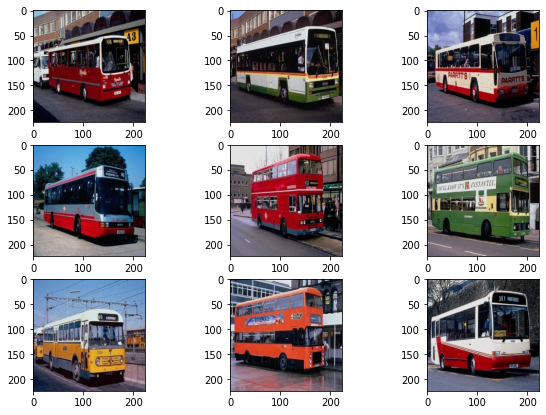

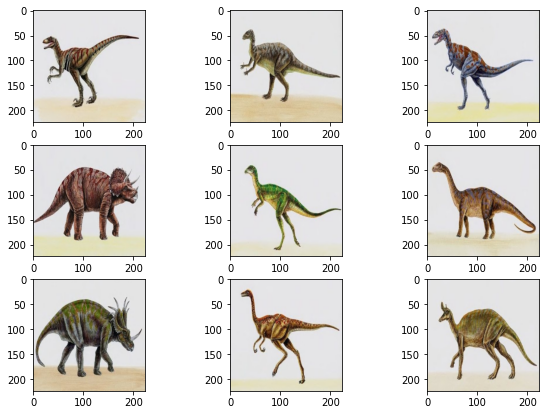

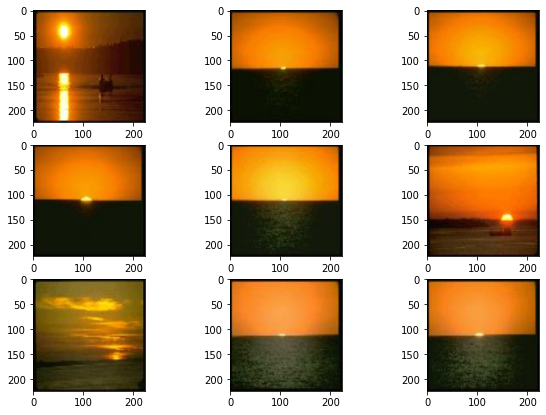

In [39]:
start = time.time()
for x in range(0,len(test_images)):
    print(test_images_path[x] +" test image")
    test_images[x] = cv2.resize(test_images[x],(224,224))
    deep_features_top_search(test_images[x],"Absolute_Difference",images_features=deep_features_2,model=EfficientNetV2B0_model,images=images)
stop = time.time()
print("Time taken by Absolute_Difference distance measure",stop-start)

225t.jpg test image
1/1 [==============================] - 0s 70ms/step
(62720,)
336t.jpg test image
1/1 [==============================] - 0s 48ms/step
(62720,)
747.jpg test image
1/1 [==============================] - 0s 45ms/step
(62720,)
Time taken by Euclidian_Distance distance measure 2.7299487590789795


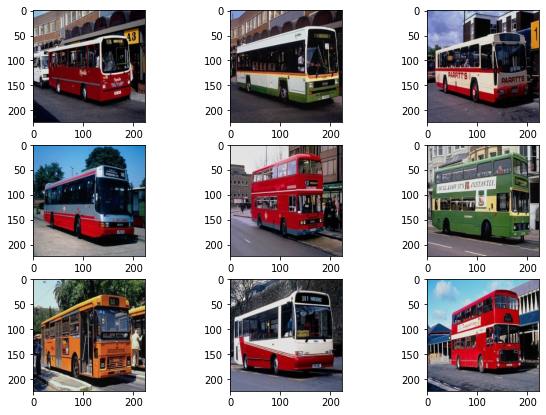

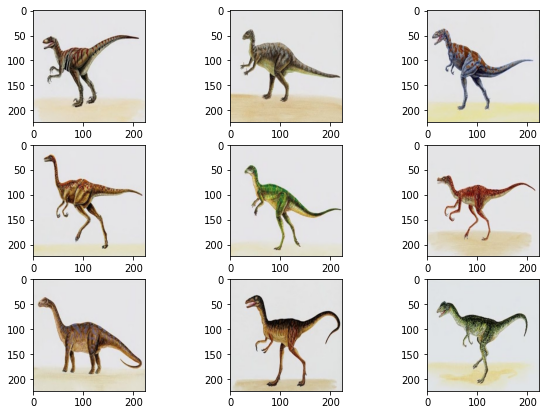

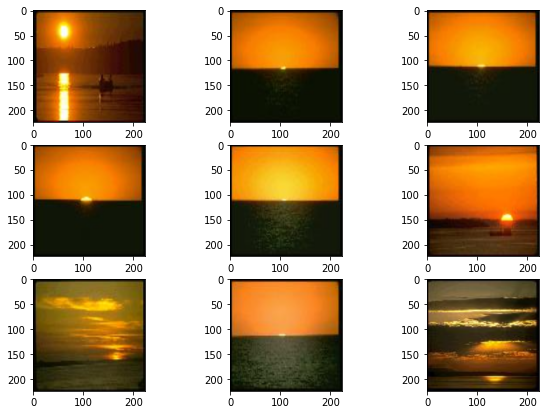

In [41]:
start = time.time()
for x in range(0,len(test_images)):
    print(test_images_path[x] +" test image")
    test_images[x] = cv2.resize(test_images[x],(224,224))
    deep_features_top_search(test_images[x],"Euclidian_Distance",images_features=deep_features_2,model=EfficientNetV2B0_model,images=resize_images)
stop = time.time()
print("Time taken by Euclidian_Distance distance measure",stop-start)

225t.jpg test image
1/1 [==============================] - 0s 63ms/step
(62720,)
336t.jpg test image
1/1 [==============================] - 0s 46ms/step
(62720,)
747.jpg test image
1/1 [==============================] - 0s 46ms/step
(62720,)
Time taken by Cosine_Similarity distance measure 4.616628408432007


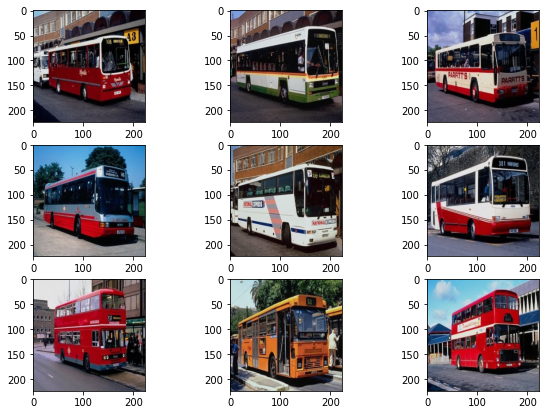

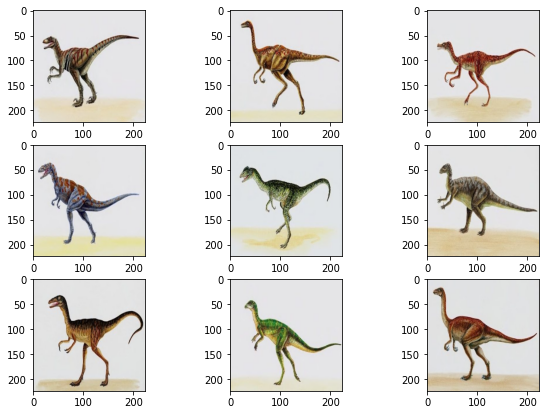

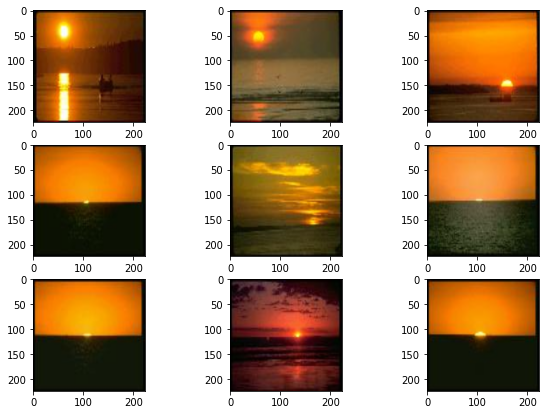

In [42]:
start = time.time()
for x in range(0,len(test_images)):
    print(test_images_path[x] +" test image")
    test_images[x] = cv2.resize(test_images[x],(224,224))
    deep_features_top_search(test_images[x],"Cosine_Similarity",images_features=deep_features_2,model=EfficientNetV2B0_model,images=resize_images)
stop = time.time()
print("Time taken by Cosine_Similarity distance measure",stop-start)